In [1079]:
#Of the players who played at their estimated peak age in 2022, which will exceed their 2022 WAR metric?

In [1080]:
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns; sns.set(style="ticks", color_codes=True)
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.svm import LinearSVC, SVC
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance

In [1081]:
#all players 1980-2022
ss_pos_df = pd.read_csv('ss_pos_df_clean.csv')
ss_pos_df.head(5)

,Rk,Player,WAR,Season,Age,Team,Lg,G,PA,AB,...,Peak_FG_wSB,Peak_FG_OBP,Peak_FG_OPS,Peak_Prev_WAR,Peak_Next_WAR,Peak_Pos_Cat,Exceed_Prev_WAR,Exceed_Peak_WAR,Team_WL,Games_played
0,14374,Garret Anderson,0.1,1994,22,4,0,5,13,13,...,-1.2,0.336,0.806,0.3,1.9,5,1.0,0.0,0.409,0.043478
1,23359,Jorge Fabregas,-0.6,1994,24,4,0,43,135,127,...,0.2,0.320,0.693,-0.3,-0.4,0,1.0,0.0,0.409,0.373913
2,3805,Tim Salmon,2.6,1994,25,4,0,100,435,373,...,-0.3,0.386,0.887,6.6,5.0,5,0.0,1.0,0.409,0.869565
3,3805,Tim Salmon,2.6,1994,25,4,0,100,435,373,...,0.2,0.306,0.628,2.8,0.7,6,0.0,1.0,0.409,0.869565
4,22287,Damion Easley,-0.4,1994,24,4,0,88,355,316,...,0.9,0.346,0.779,5.6,4.0,2,0.0,1.0,0.409,0.765217


In [1082]:
#find rows to predict
ss_pos_df_2023 = ss_pos_df[(ss_pos_df['Peak_Season'] == 2022) & (ss_pos_df['Season'] == 2022)]

#test set
ss_pos_df_2023

,Rk,Player,WAR,Season,Age,Team,Lg,G,PA,AB,...,Peak_FG_wSB,Peak_FG_OBP,Peak_FG_OPS,Peak_Prev_WAR,Peak_Next_WAR,Peak_Pos_Cat,Exceed_Prev_WAR,Exceed_Peak_WAR,Team_WL,Games_played
10447,7405,Tyler O'Neill,1.3,2022,27,25,1,96,383,334,...,0.8,0.308,0.700,6.3,NaN,5,0.0,NaN,0.574,0.592593
10449,405,Tommy Edman,6.4,2022,27,25,1,153,630,577,...,4.6,0.324,0.725,3.7,NaN,4,1.0,NaN,0.574,0.944444
11977,5064,Anthony Santander,2.1,2022,27,2,0,152,647,574,...,-1.4,0.318,0.773,0.2,NaN,5,1.0,NaN,0.512,0.938272
11978,2562,Jorge Mateo,3.4,2022,27,2,0,150,533,494,...,3.0,0.267,0.646,-0.4,NaN,4,1.0,NaN,0.512,0.925926
12349,3251,Isiah Kiner-Falefa,3.0,2022,27,18,0,142,531,483,...,2.2,0.314,0.642,3.7,NaN,4,0.0,NaN,0.611,0.876543
12559,7237,Michael Brantley,1.3,2022,35,12,0,64,277,243,...,-0.5,0.370,0.785,2.5,NaN,6,0.0,NaN,0.654,0.395062
12563,1387,Alex Bregman,4.5,2022,28,12,0,155,656,548,...,-1.3,0.366,0.820,2.1,NaN,3,1.0,NaN,0.654,0.956790
12564,7254,Chas McCormick,1.3,2022,27,12,0,119,407,359,...,-0.8,0.332,0.738,2.3,NaN,5,0.0,NaN,0.654,0.734568
12646,21429,Colin Moran,-0.3,2022,29,7,1,42,128,109,...,-0.1,0.305,0.681,0.0,NaN,1,0.0,NaN,0.383,0.259259
12649,20510,Max Schrock,-0.3,2022,27,7,1,13,27,26,...,0.0,0.185,0.339,-0.1,NaN,5,0.0,NaN,0.383,0.080247


In [1083]:
#check one
ss_pos_df_2023[["FG_playerid","Season","Peak_Season","Age","Peak_Age","Prev_WAR","WAR","Next_WAR","Peak_Prev_WAR","Peak_WAR","Peak_Next_WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]][ss_pos_df_2023["FG_playerid"] == 14162]



,FG_playerid,Season,Peak_Season,Age,Peak_Age,Prev_WAR,WAR,Next_WAR,Peak_Prev_WAR,Peak_WAR,Peak_Next_WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
13324,14162,2022,2022,27,27,7.2,5.4,NaN,7.2,5.4,NaN,0.0,NaN


In [1084]:
#drop nans from batting_ss_peaks_merge2
#ss_pos_df_train = ss_pos_df[ss_pos_df['Peak_Next_WAR'].notna()]
#ss_pos_df_train = ss_pos_df[(ss_pos_df['Peak_Season'] != 2022) & (ss_pos_df['Season'] = 2022)]
ss_pos_df_train = ss_pos_df[ss_pos_df['Exceed_Peak_WAR'].notna()]
ss_pos_df_train = ss_pos_df_train[ss_pos_df_train['Exceed_Peak_WAR'] != '']
ss_pos_df_train = ss_pos_df_train[ss_pos_df_train['Exceed_Prev_WAR'] != '']

#train set
ss_pos_df_train

,Rk,Player,WAR,Season,Age,Team,Lg,G,PA,AB,...,Peak_FG_wSB,Peak_FG_OBP,Peak_FG_OPS,Peak_Prev_WAR,Peak_Next_WAR,Peak_Pos_Cat,Exceed_Prev_WAR,Exceed_Peak_WAR,Team_WL,Games_played
0,14374,Garret Anderson,0.1,1994,22,4,0,5,13,13,...,-1.2,0.336,0.806,0.3,1.9,5,1.0,0.0,0.409,0.043478
1,23359,Jorge Fabregas,-0.6,1994,24,4,0,43,135,127,...,0.2,0.320,0.693,-0.3,-0.4,0,1.0,0.0,0.409,0.373913
2,3805,Tim Salmon,2.6,1994,25,4,0,100,435,373,...,-0.3,0.386,0.887,6.6,5.0,5,0.0,1.0,0.409,0.869565
3,3805,Tim Salmon,2.6,1994,25,4,0,100,435,373,...,0.2,0.306,0.628,2.8,0.7,6,0.0,1.0,0.409,0.869565
4,22287,Damion Easley,-0.4,1994,24,4,0,88,355,316,...,0.9,0.346,0.779,5.6,4.0,2,0.0,1.0,0.409,0.765217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15709,22050,Darrell Miller,-0.4,1984,26,4,0,17,45,41,...,-0.4,0.400,0.983,-0.4,-0.7,5,1.0,0.0,0.500,0.104938
15711,14752,Jerry Narron,0.1,1984,28,4,0,69,162,150,...,0.0,0.292,0.598,0.1,-0.2,0,0.0,0.0,0.500,0.425926
15712,5281,Gary Pettis,2.0,1984,26,4,0,140,466,397,...,7.4,0.347,0.670,2.0,5.1,5,1.0,1.0,0.500,0.864198
15713,17394,Dick Schofield,-0.1,1984,21,4,0,140,452,400,...,-1.2,0.363,0.660,2.5,0.8,4,0.0,0.0,0.500,0.864198


In [1085]:
#check one
ss_pos_df_train[["FG_playerid","Season","Peak_Season","Age","Peak_Age","Prev_WAR","WAR","Next_WAR","Peak_Prev_WAR","Peak_WAR","Peak_Next_WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]][ss_pos_df_train["FG_playerid"] == 3797]



,FG_playerid,Season,Peak_Season,Age,Peak_Age,Prev_WAR,WAR,Next_WAR,Peak_Prev_WAR,Peak_WAR,Peak_Next_WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
1618,3797,2007,2010,24,27,0.8,3.2,4.8,0.5,1.3,4.1,1.0,1.0
1632,3797,2008,2010,25,27,3.2,4.8,0.5,0.5,1.3,4.1,1.0,1.0
1645,3797,2009,2010,26,27,4.8,0.5,1.3,0.5,1.3,4.1,1.0,1.0
2070,3797,2005,2010,22,27,NaN,1.8,0.8,0.5,1.3,4.1,1.0,1.0
2083,3797,2006,2010,23,27,1.8,0.8,3.2,0.5,1.3,4.1,1.0,1.0
4219,3797,2011,2010,28,27,1.3,4.1,3.3,0.5,1.3,4.1,1.0,1.0
4232,3797,2012,2010,29,27,4.1,3.3,3.6,0.5,1.3,4.1,1.0,1.0
4242,3797,2013,2010,30,27,3.3,3.6,3.1,0.5,1.3,4.1,1.0,1.0
7476,3797,2010,2010,27,27,0.5,1.3,4.1,0.5,1.3,4.1,1.0,1.0
11646,3797,2014,2010,31,27,3.6,3.1,-0.3,0.5,1.3,4.1,1.0,1.0


In [1086]:
#drop rows where Prev_WAR are null
ss_pos_df_train_2 = ss_pos_df_train.dropna(subset=['Prev_WAR'])

In [1087]:
#check name
ss_pos_df_train_2[["FG_playerid","Season","Peak_Season","Age","Peak_Age","Prev_WAR","WAR","Next_WAR","Peak_Prev_WAR","Peak_WAR","Peak_Next_WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]][ss_pos_df_train_2["FG_playerid"] == 3797]



,FG_playerid,Season,Peak_Season,Age,Peak_Age,Prev_WAR,WAR,Next_WAR,Peak_Prev_WAR,Peak_WAR,Peak_Next_WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
1618,3797,2007,2010,24,27,0.8,3.2,4.8,0.5,1.3,4.1,1.0,1.0
1632,3797,2008,2010,25,27,3.2,4.8,0.5,0.5,1.3,4.1,1.0,1.0
1645,3797,2009,2010,26,27,4.8,0.5,1.3,0.5,1.3,4.1,1.0,1.0
2083,3797,2006,2010,23,27,1.8,0.8,3.2,0.5,1.3,4.1,1.0,1.0
4219,3797,2011,2010,28,27,1.3,4.1,3.3,0.5,1.3,4.1,1.0,1.0
4232,3797,2012,2010,29,27,4.1,3.3,3.6,0.5,1.3,4.1,1.0,1.0
4242,3797,2013,2010,30,27,3.3,3.6,3.1,0.5,1.3,4.1,1.0,1.0
7476,3797,2010,2010,27,27,0.5,1.3,4.1,0.5,1.3,4.1,1.0,1.0
11646,3797,2014,2010,31,27,3.6,3.1,-0.3,0.5,1.3,4.1,1.0,1.0
12017,3797,2017,2010,34,27,2.1,-0.1,NaN,0.5,1.3,4.1,1.0,1.0


In [1088]:
#grab player name
ss_pos_df_train_2_player = ss_pos_df_train_2['Player'].reset_index(drop=True)

In [1089]:
#drop Next_WAR & Peak_Next_WAR cols 
ss_pos_df_train_2 = ss_pos_df_train_2.drop(['Next_WAR','Peak_Next_WAR','Player'], axis=1)

In [1090]:
#check one
ss_pos_df_train_2[["FG_playerid","Season","Peak_Season","Age","Peak_Age","Prev_WAR","WAR","Peak_Prev_WAR","Peak_WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]][ss_pos_df_train_2["FG_playerid"] == 3797]



,FG_playerid,Season,Peak_Season,Age,Peak_Age,Prev_WAR,WAR,Peak_Prev_WAR,Peak_WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
1618,3797,2007,2010,24,27,0.8,3.2,0.5,1.3,1.0,1.0
1632,3797,2008,2010,25,27,3.2,4.8,0.5,1.3,1.0,1.0
1645,3797,2009,2010,26,27,4.8,0.5,0.5,1.3,1.0,1.0
2083,3797,2006,2010,23,27,1.8,0.8,0.5,1.3,1.0,1.0
4219,3797,2011,2010,28,27,1.3,4.1,0.5,1.3,1.0,1.0
4232,3797,2012,2010,29,27,4.1,3.3,0.5,1.3,1.0,1.0
4242,3797,2013,2010,30,27,3.3,3.6,0.5,1.3,1.0,1.0
7476,3797,2010,2010,27,27,0.5,1.3,0.5,1.3,1.0,1.0
11646,3797,2014,2010,31,27,3.6,3.1,0.5,1.3,1.0,1.0
12017,3797,2017,2010,34,27,2.1,-0.1,0.5,1.3,1.0,1.0


In [1091]:
#drop rows where Prev_WAR & Next_WAR are null
#ss_pos_df_test_2 = ss_pos_df_test.dropna(subset=['Prev_WAR','Next_WAR'])
ss_pos_df_2023[['Prev_WAR','WAR','Next_WAR','Peak_Prev_WAR','Peak_WAR','Peak_Next_WAR']]

,Prev_WAR,WAR,Next_WAR,Peak_Prev_WAR,Peak_WAR,Peak_Next_WAR
10447,6.3,1.3,NaN,6.3,1.3,NaN
10449,3.7,6.4,NaN,3.7,6.4,NaN
11977,0.2,2.1,NaN,0.2,2.1,NaN
11978,-0.4,3.4,NaN,-0.4,3.4,NaN
12349,3.7,3.0,NaN,3.7,3.0,NaN
12559,2.5,1.3,NaN,2.5,1.3,NaN
12563,2.1,4.5,NaN,2.1,4.5,NaN
12564,2.3,1.3,NaN,2.3,1.3,NaN
12646,0.0,-0.3,NaN,0.0,-0.3,NaN
12649,-0.1,-0.3,NaN,-0.1,-0.3,NaN


In [1092]:
#drop rows where Prev_WAR are null
ss_pos_df_2023_2 = ss_pos_df_2023.dropna(subset=['Prev_WAR'])

In [1093]:
#grab player name
ss_pos_df_2023_2_player = ss_pos_df_2023_2['Player'].reset_index(drop=True)

In [1094]:
#drop Next_WAR & Peak_Next_WAR cols 
ss_pos_df_2023_2 = ss_pos_df_2023_2.drop(['Next_WAR','Peak_Next_WAR','Player'], axis=1)

In [1095]:
#check
ss_pos_df_2023_2

,Rk,WAR,Season,Age,Team,Lg,G,PA,AB,R,...,Peak_FG_wRC,Peak_FG_wSB,Peak_FG_OBP,Peak_FG_OPS,Peak_Prev_WAR,Peak_Pos_Cat,Exceed_Prev_WAR,Exceed_Peak_WAR,Team_WL,Games_played
10447,7405,1.3,2022,27,25,1,96,383,334,56,...,43,0.8,0.308,0.700,6.3,5,0.0,NaN,0.574,0.592593
10449,405,6.4,2022,27,25,1,153,630,577,95,...,76,4.6,0.324,0.725,3.7,4,1.0,NaN,0.574,0.944444
11977,5064,2.1,2022,27,2,0,152,647,574,78,...,87,-1.4,0.318,0.773,0.2,5,1.0,NaN,0.512,0.938272
11978,2562,3.4,2022,27,2,0,150,533,494,63,...,49,3.0,0.267,0.646,-0.4,4,1.0,NaN,0.512,0.925926
12349,3251,3.0,2022,27,18,0,142,531,483,66,...,50,2.2,0.314,0.642,3.7,4,0.0,NaN,0.611,0.876543
12559,7237,1.3,2022,35,12,0,64,277,243,28,...,39,-0.5,0.370,0.785,2.5,6,0.0,NaN,0.654,0.395062
12563,1387,4.5,2022,28,12,0,155,656,548,93,...,100,-1.3,0.366,0.820,2.1,3,1.0,NaN,0.654,0.956790
12564,7254,1.3,2022,27,12,0,119,407,359,47,...,52,-0.8,0.332,0.738,2.3,5,0.0,NaN,0.654,0.734568
12646,21429,-0.3,2022,29,7,1,42,128,109,11,...,14,-0.1,0.305,0.681,0.0,1,0.0,NaN,0.383,0.259259
12649,20510,-0.3,2022,27,7,1,13,27,26,1,...,0,0.0,0.185,0.339,-0.1,5,0.0,NaN,0.383,0.080247


In [1096]:
#check correlations

In [1097]:
#break into multiple datasets
ss_pos_df_train_2_1 = ss_pos_df_train_2.iloc[:, 0:25]
ss_pos_df_train_2_2 = ss_pos_df_train_2.iloc[:, 26:50]
ss_pos_df_train_2_3 = ss_pos_df_train_2.iloc[:, 51:75]
ss_pos_df_train_2_4 = ss_pos_df_train_2.iloc[:, 76:]

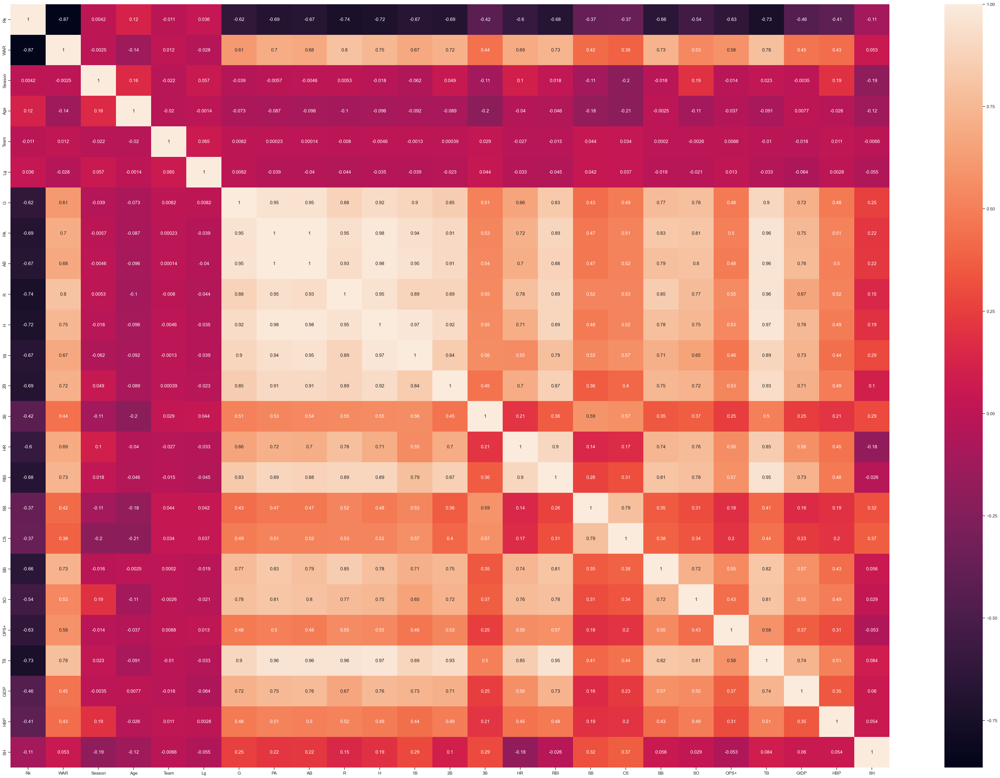

In [1098]:
#correlation
X = ss_pos_df_train_2_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_pos_df_train_2_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_pos_df_train_2_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(50,35)})
plt.show()

In [1099]:
#G & PA, AB, R, H, 1B, 2B, RBI, SO, TB

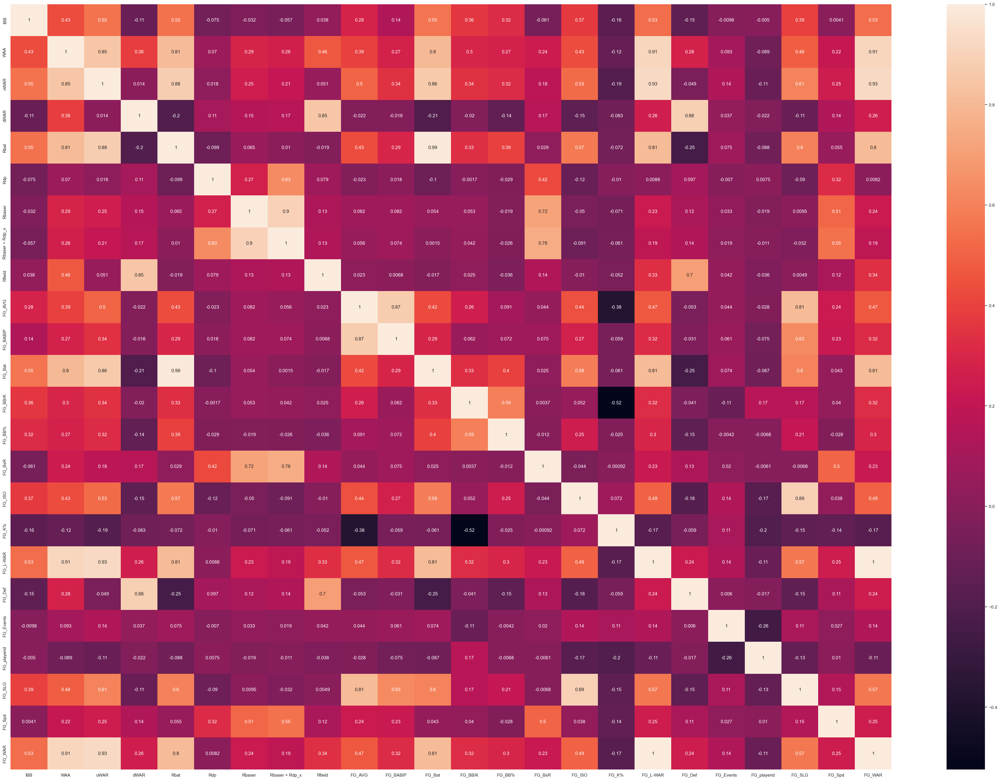

In [1100]:
#correlation
X = ss_pos_df_train_2_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_pos_df_train_2_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_pos_df_train_2_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [1101]:
#WAA & dWAR, Rbat, FG_Bat, FG_L-WAR
#dWAR & Rbat, FG_Bat, FG_Def
#Rbat & WAA, dWAR, FG_Bat, FG_L-WAR
#Rbaser & Rbaser + Rdp_x
#Rfield & dWAR
#FG_AVG & FG_BABIP, FG_SLG
#FG_Bat & WAA, dWAR, Rbat, FG_L-WAR
#FG_L-WAR & WAA, dWAR, Rbat, FG_Bat
#FG_Def & dWAR
#FG_SLG & FG_ISO, FG_AVG

#2 FG_SLG?

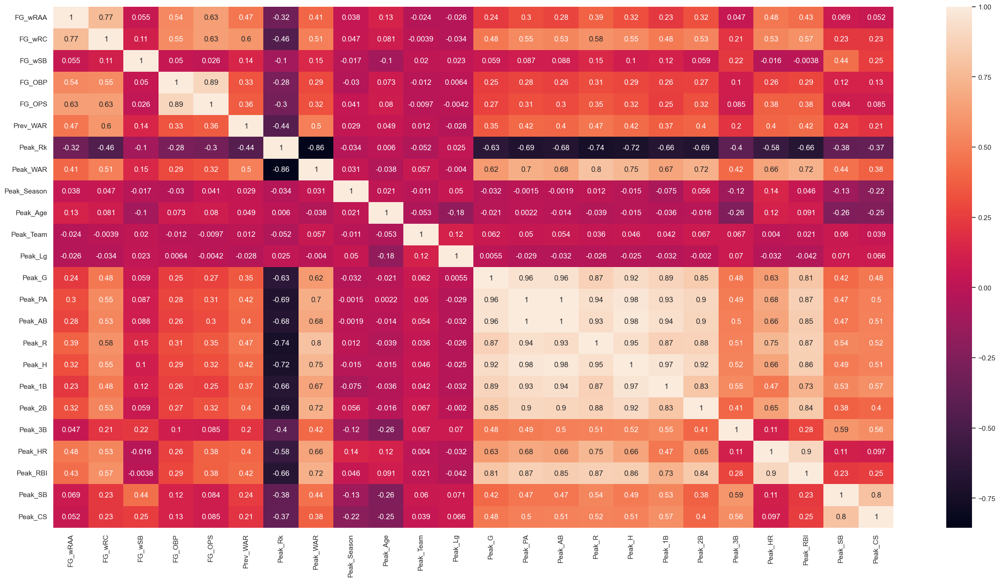

In [1102]:
#correlation
X = ss_pos_df_train_2_3.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_pos_df_train_2_3.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_pos_df_train_2_3.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [1103]:
#FG_WOBA & FG_OBP, FG_SLG, FG_OPS
#FG_OBP & FG_OPS
#FG_SLG & FG_OPS


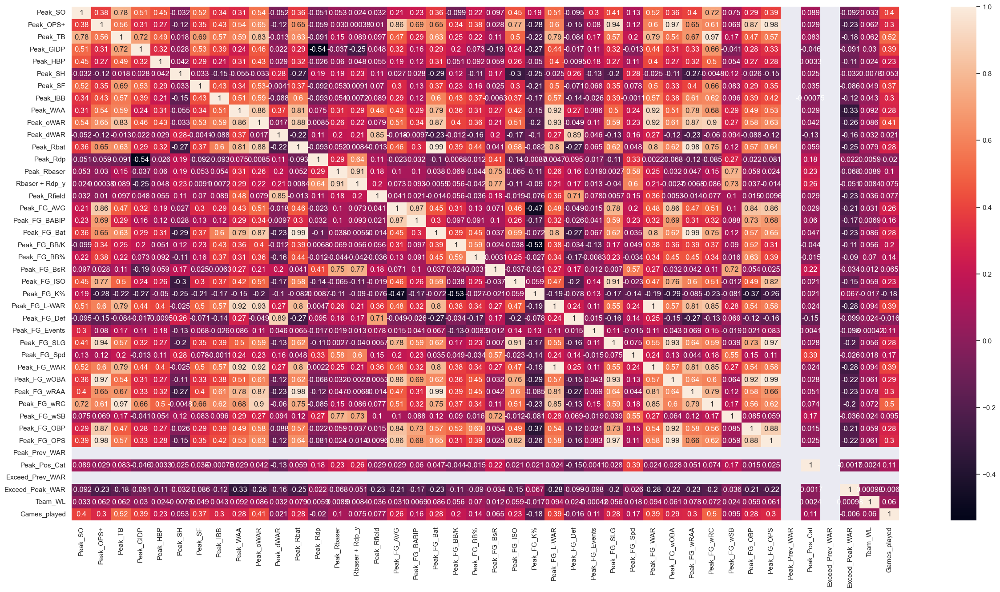

In [1104]:
#correlation
X = ss_pos_df_train_2_4.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_pos_df_train_2_4.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_pos_df_train_2_4.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [1105]:
#drop highly correlated features
ss_pos_df_train_2 = ss_pos_df_train_2.drop(['Peak_G','G','Peak_PA','PA','Peak_AB','AB','Peak_R','R','Peak_H','H','Peak_1B','1B','Peak_2B','2B','Peak_RBI','RBI','Peak_SO','SO','Peak_TB','TB','WAA','Peak_WAA','dWAR','Peak_dWAR','Rbat','Peak_Rbat','FG_Bat','Peak_FG_Bat','FG_L-WAR','Peak_FG_L-WAR','Rbaser + Rdp_x','FG_SLG','FG_OBP','Peak_FG_OBP'], axis=1)


In [1106]:
#break into multiple datasets for correlations
ss_pos_df_train_2_1 = ss_pos_df_train_2.iloc[:, 0:25]
ss_pos_df_train_2_2 = ss_pos_df_train_2.iloc[:, 26:50]
ss_pos_df_train_2_3 = ss_pos_df_train_2.iloc[:, 51:75]
ss_pos_df_train_2_4 = ss_pos_df_train_2.iloc[:, 76:]

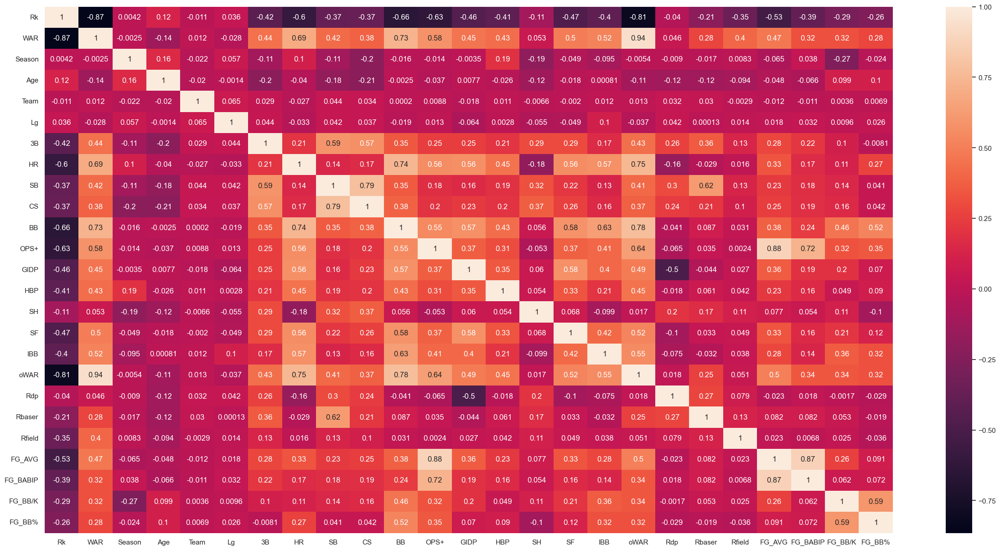

In [1107]:
#correlation
X = ss_pos_df_train_2_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_pos_df_train_2_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_pos_df_train_2_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(50,35)})
plt.show()

In [1108]:
#WAR & oWAR
#FG_AVG & OPS+, FG_BABIP

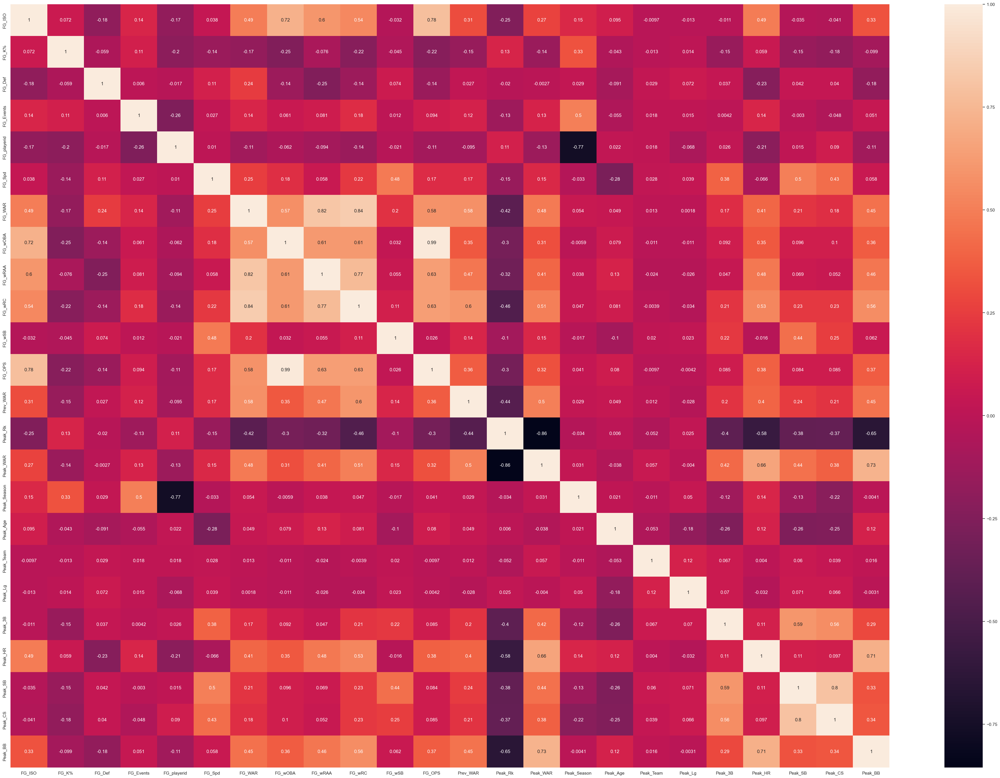

In [1109]:
#correlation
X = ss_pos_df_train_2_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_pos_df_train_2_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_pos_df_train_2_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(50,35)})
plt.show()

In [1110]:
#FG_WAR & FG_wRAA, FG_wRC
#FG_wOBA & FG_OPS

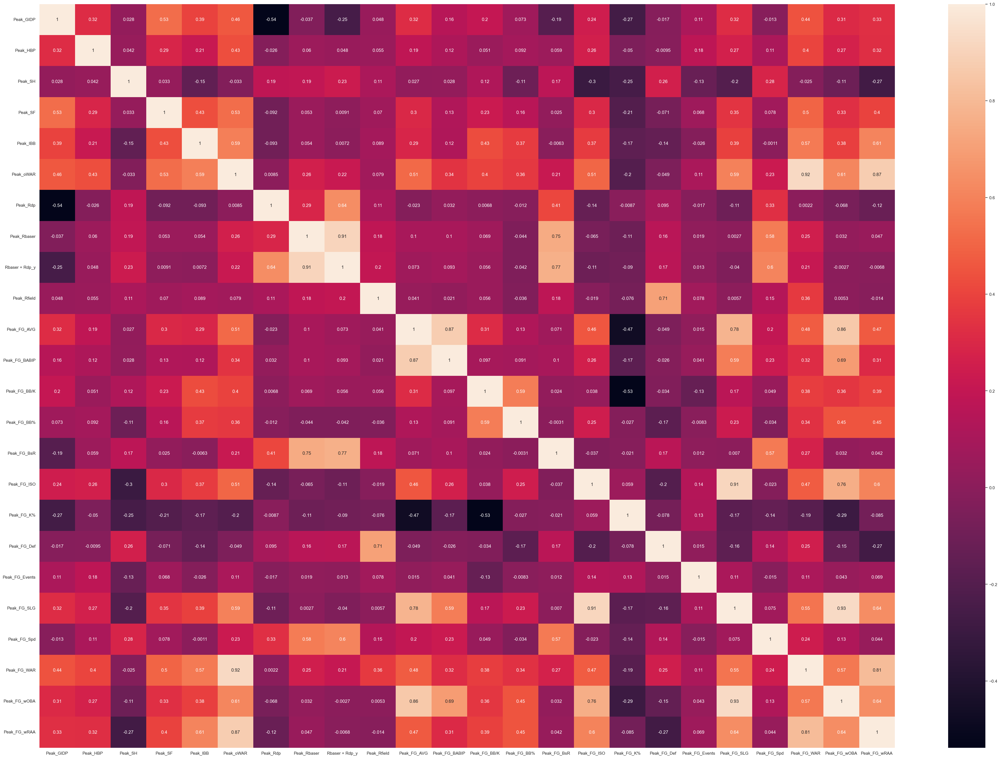

In [1111]:
#correlation
X = ss_pos_df_train_2_3.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_pos_df_train_2_3.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_pos_df_train_2_3.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(50,35)})
plt.show()

In [1112]:
#Peak_oWAR & Peak_FG_WAR
#Peak_Rbaser & Rbaser + Rdp_y
#Peak_FG_AVG & Peak_FG_BABIP, Peak_FG_wOBA
#Peak_FG_ISO & Peak_FG_SLG, Peak_FG_SLG
#FG_SLG & Peak_FG_ISO, Peak_FG_wOBA
#Peak_FG_WAR & Peak_oWAR
#Peak_FG_wOBA & Peak_FG_AVG, Peak_FG_AVG

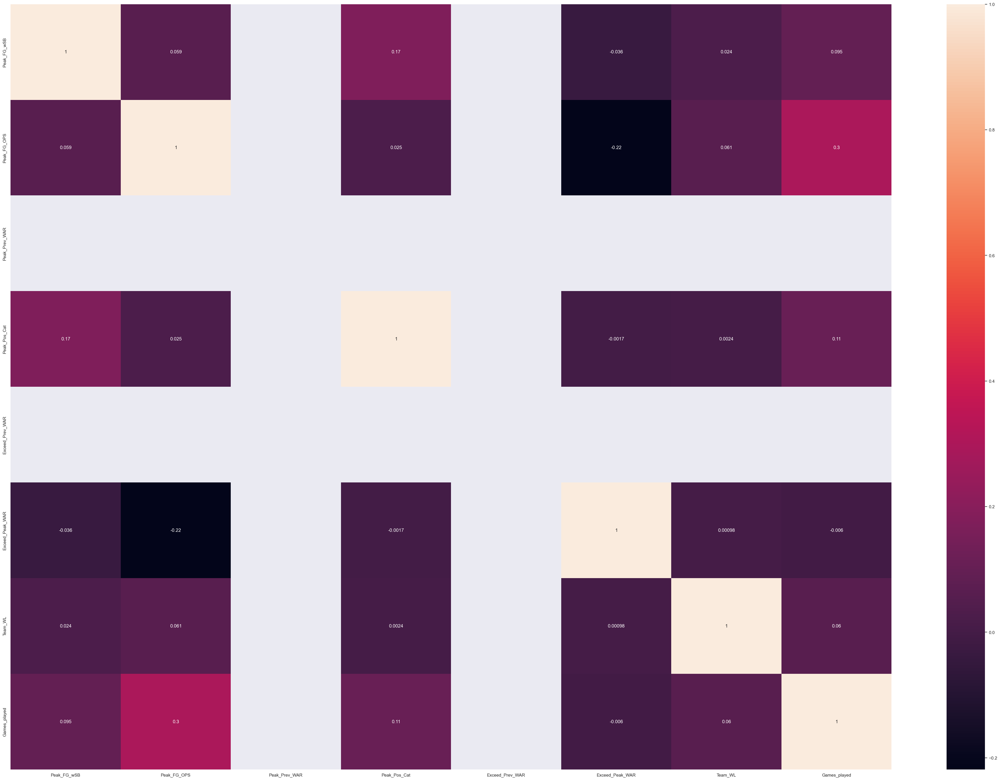

In [1113]:
#correlation
X = ss_pos_df_train_2_4.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_pos_df_train_2_4.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_pos_df_train_2_4.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(15,15)})
plt.show()

In [1114]:
#Peak_FG_SLG
#WAR & oWAR
#FG_AVG & OPS+, FG_BABIP
#FG_WAR & FG_wRAA, FG_wRC
#FG_wOBA & FG_OPS
#Peak_oWAR & Peak_FG_WAR
#Peak_Rbaser & Rbaser + Rdp_y
#Peak_FG_AVG & Peak_FG_BABIP, Peak_FG_wOBA
#Peak_FG_ISO & Peak_FG_SLG, Peak_FG_SLG
#FG_SLG & Peak_FG_ISO, Peak_FG_wOBA
#Peak_FG_WAR & Peak_oWAR
#Peak_FG_wOBA & Peak_FG_AVG, Peak_FG_AVG

In [1115]:
#drop highly correlated features
ss_pos_df_train_2 = ss_pos_df_train_2.drop(['Peak_FG_SLG','oWAR','FG_AVG', 'FG_WAR','FG_wOBA',
                                            'Rbaser + Rdp_y','Peak_Rbaser','Peak_oWAR', 'Peak_FG_WAR', 
                                            'Peak_FG_AVG','Peak_FG_wOBA'], axis=1)


In [1116]:
#break into multiple datasets
ss_pos_df_train_2_1 = ss_pos_df_train_2.iloc[:, 0:25]
ss_pos_df_train_2_2 = ss_pos_df_train_2.iloc[:, 26:50]
ss_pos_df_train_2_3 = ss_pos_df_train_2.iloc[:, 51:75]
ss_pos_df_train_2_4 = ss_pos_df_train_2.iloc[:, 76:]

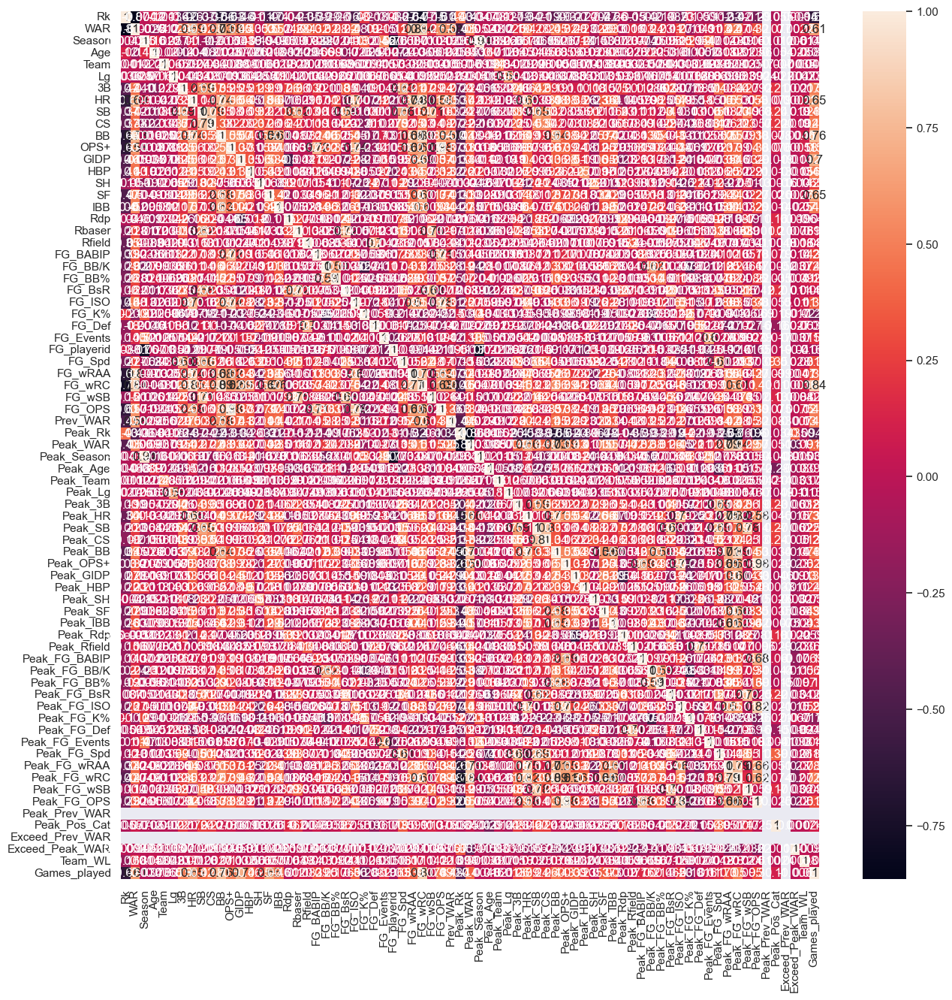

In [1117]:
#correlation
X = ss_pos_df_train_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_pos_df_train_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_pos_df_train_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(50,35)})
plt.show()

In [1118]:
#Rk, Peak_Rk, FG_wRC, Peak_FG_wRC, FG_wRAA, Peak_FG_ISO, Peak_FG_OPS, FG_OPS remove
#Peak_FG_OPS & Peak_FG_ISO
#Peak_Season & Season
#FG_OPS & OPS+
#Peak_WAR & Peak_FG_wRC

In [1119]:
#drop highly correlated features
ss_pos_df_train_2 = ss_pos_df_train_2.drop(["Rk","Peak_Rk","FG_wRC","Peak_FG_wRC","FG_wRAA",
                                            "Peak_FG_ISO","Peak_FG_OPS","FG_OPS"], axis=1)


In [1120]:
ss_pos_df_train_2 = ss_pos_df_train_2.drop(["Peak_Season"], axis=1)

In [1121]:
#drop rows where Peak_Prev_WAR are null
ss_pos_df_train_2 = ss_pos_df_train_2.dropna(subset=['Peak_Prev_WAR'])
ss_pos_df_train_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12224 entries, 2 to 15714
Data columns (total 64 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   WAR              12224 non-null  float64
 1   Season           12224 non-null  int64  
 2   Age              12224 non-null  int64  
 3   Team             12224 non-null  int64  
 4   Lg               12224 non-null  int64  
 5   3B               12224 non-null  int64  
 6   HR               12224 non-null  int64  
 7   SB               12224 non-null  int64  
 8   CS               12224 non-null  int64  
 9   BB               12224 non-null  int64  
 10  OPS+             12224 non-null  int64  
 11  GIDP             12224 non-null  int64  
 12  HBP              12224 non-null  int64  
 13  SH               12224 non-null  int64  
 14  SF               12224 non-null  int64  
 15  IBB              12224 non-null  int64  
 16  Rdp              12224 non-null  int64  
 17  Rbaser      

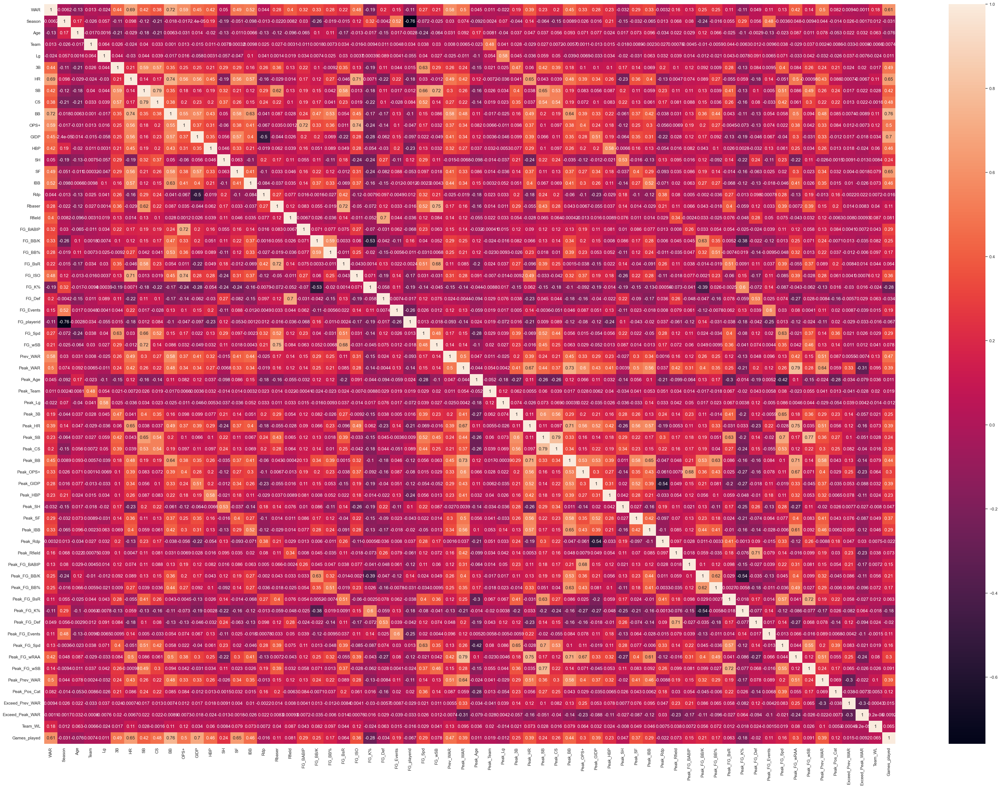

In [1122]:
#correlation
X = ss_pos_df_train_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_pos_df_train_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_pos_df_train_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(50,35)})
plt.show()

In [1123]:
#get playerid
ss_pos_df_train_2_id = ss_pos_df_train_2["FG_playerid"]
ss_pos_df_train_2 = ss_pos_df_train_2.drop(["FG_playerid"], axis=1)

In [1124]:
#set x and y
ss_pos_df_X = ss_pos_df_train_2.loc[:, ss_pos_df_train_2.columns != 'Exceed_Peak_WAR'].values
ss_pos_df_y = ss_pos_df_train_2.loc[:, ss_pos_df_train_2.columns == 'Exceed_Peak_WAR'].values.ravel()

In [1125]:
#set label encoder on y
label_encoder = LabelEncoder()
ss_pos_df_y_enc = label_encoder.fit_transform(ss_pos_df_y)

In [1126]:
#function to split training set for testing porposes
def split_eval_docs(_clf, _Xdocs, _ydocs):
    X_train, X_test, y_train, y_test = train_test_split(_Xdocs, _ydocs, test_size=0.3, random_state=42)
    _clf.fit(X_train, y_train)
    y_pred = _clf.predict(X_test)
    return y_test, y_pred, X_test, X_train

In [1127]:
#define RF pipeline
n_cores = 8
rf = Pipeline([('clf', RandomForestClassifier(n_jobs=n_cores, n_estimators=1000,
                                              max_depth=10, random_state=None, class_weight='balanced'))])

In [1128]:
%%time

y_test, y_pred, X_test, X_train = split_eval_docs(rf, ss_pos_df_X, ss_pos_df_y_enc)
print('Random Forest\n' + classification_report(y_test, y_pred, target_names=['0','1']))

Random Forest
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      2017
           1       0.97      0.96      0.97      1651

    accuracy                           0.97      3668
   macro avg       0.97      0.97      0.97      3668
weighted avg       0.97      0.97      0.97      3668

CPU times: user 13.6 s, sys: 436 ms, total: 14 s
Wall time: 2.46 s


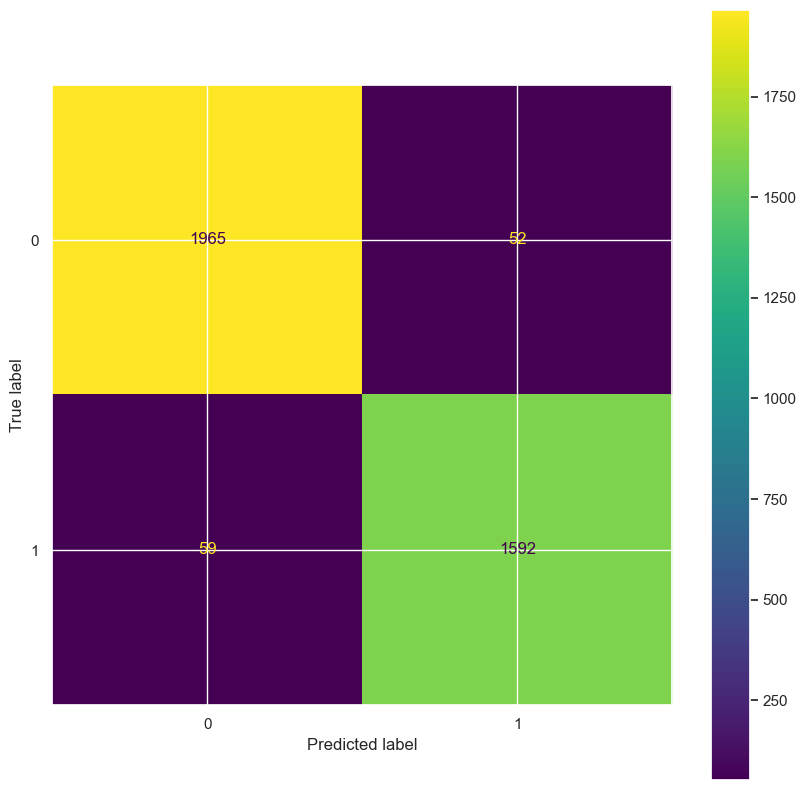

In [1129]:
# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

cmp = ConfusionMatrixDisplay(confusion_matrix=cm)

fig, ax = plt.subplots(figsize=(10,10))
cmp.plot(ax=ax)

In [1130]:
#most important features
perm_importance = permutation_importance(rf, X_test, y_test)

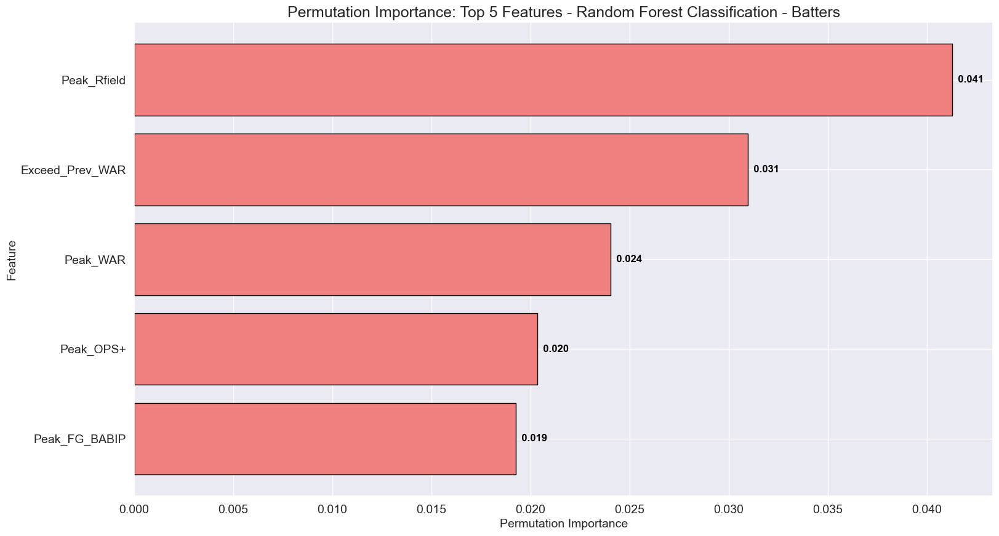

In [1203]:
#plot top 5 features
sorted_idx = perm_importance.importances_mean.argsort()

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(1, 1, 1)
ax.barh(ss_pos_df_train_2.columns[sorted_idx][-5:], perm_importance.importances_mean[sorted_idx][-5:], color="lightcoral", edgecolor="black")
for i in range(5):
    ax.text(perm_importance.importances_mean[sorted_idx][-5:][i], i, str("  {0:.3f}".format(perm_importance.importances_mean[sorted_idx][-5:][i])), color='black', size=12, fontweight='bold', ha='left', va='center')

ax.set_xlabel("Permutation Importance", size=14)
ax.set_ylabel("Feature", size=14)
ax.set_title("Permutation Importance: Top 5 Features - Random Forest Classification - Batters", size=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()



In [1132]:
#drop highly correlated features for 2023 ds
ss_pos_df_2023_2 = ss_pos_df_2023_2.drop(['Peak_G','G','Peak_PA','PA','Peak_AB','AB','Peak_R','R','Peak_H',
                                            'H','Peak_1B','1B','Peak_2B','2B','Peak_RBI','RBI','Peak_SO','SO',
                                            'Peak_TB','TB','WAA','Peak_WAA','dWAR','Peak_dWAR','Rbat','Peak_Rbat',
                                            'FG_Bat','Peak_FG_Bat','FG_L-WAR','Peak_FG_L-WAR','Rbaser + Rdp_x',
                                            'FG_SLG','FG_OBP','Peak_FG_OBP','Peak_FG_SLG','oWAR','FG_AVG', 
                                            'FG_WAR','FG_wOBA','Rbaser + Rdp_y','Peak_Rbaser','Peak_oWAR', 
                                            'Peak_FG_WAR', 'Peak_FG_AVG','Peak_FG_wOBA','Rk','Peak_Rk','FG_wRC',
                                            'Peak_FG_wRC','FG_wRAA','Peak_FG_ISO','Peak_FG_OPS','FG_OPS'], axis=1)



In [1133]:
ss_pos_df_2023_2 = ss_pos_df_2023_2.drop(["Peak_Season"], axis=1)

In [1134]:
#confirm 2023 set
ss_pos_df_2023_2[["WAR","Season","Age","Team","Lg","3B","HR","SB","CS","BB","OPS+","GIDP","HBP","SH","SF","IBB","Rdp","Rbaser","Rfield","FG_BABIP","FG_BB/K","FG_BB%","FG_BsR","FG_ISO","FG_K%","FG_Def","FG_Events","FG_playerid","FG_Spd","FG_wSB","Prev_WAR","Peak_WAR","Peak_Age","Peak_Team","Peak_Lg","Peak_3B","Peak_HR","Peak_SB","Peak_CS","Peak_BB","Peak_OPS+","Peak_GIDP","Peak_HBP","Peak_SH","Peak_SF","Peak_IBB","Peak_Rdp","Peak_Rfield","Peak_FG_BABIP","Peak_FG_BB/K","Peak_FG_BB%","Peak_FG_BsR","Peak_FG_K%","Peak_FG_Def","Peak_FG_Events","Peak_FG_Spd","Peak_FG_wRAA","Peak_FG_wSB","Peak_Prev_WAR","Peak_Pos_Cat","Exceed_Prev_WAR","Exceed_Peak_WAR","Games_played","Team_WL"]]


,WAR,Season,Age,Team,Lg,3B,HR,SB,CS,BB,...,Peak_FG_Events,Peak_FG_Spd,Peak_FG_wRAA,Peak_FG_wSB,Peak_Prev_WAR,Peak_Pos_Cat,Exceed_Prev_WAR,Exceed_Peak_WAR,Games_played,Team_WL
10447,1.3,2022,27,25,1,1,14,14,4,38,...,238,5.9,-0.7,0.8,6.3,5,0.0,NaN,0.592593,0.574
10449,6.4,2022,27,25,1,4,13,32,3,46,...,468,7.2,3.9,4.6,3.7,4,1.0,NaN,0.944444,0.574
11977,2.1,2022,27,2,0,0,33,0,2,55,...,457,1.6,13.3,-1.4,0.2,5,1.0,NaN,0.938272,0.512
11978,3.4,2022,27,2,0,7,13,35,9,27,...,354,8.4,-12.1,3.0,-0.4,4,1.0,NaN,0.925926,0.512
12349,3.0,2022,27,18,0,0,4,22,4,35,...,419,5.2,-10.4,2.2,3.7,4,0.0,NaN,0.876543,0.611
12559,1.3,2022,35,12,0,1,5,1,1,31,...,215,2.5,7.7,-0.5,2.5,6,0.0,NaN,0.395062,0.654
12563,4.5,2022,28,12,0,0,23,1,2,87,...,481,2.0,25.0,-1.3,2.1,3,1.0,NaN,0.956790,0.654
12564,1.3,2022,27,12,0,2,14,4,3,46,...,254,3.8,5.3,-0.8,2.3,5,0.0,NaN,0.734568,0.654
12646,-0.3,2022,29,7,1,0,5,0,0,16,...,82,0.6,-1.0,-0.1,0.0,1,0.0,NaN,0.259259,0.383
12649,-0.3,2022,27,7,1,0,0,0,0,1,...,20,0.8,-3.3,0.0,-0.1,5,0.0,NaN,0.080247,0.383


In [1135]:
#get playerid
ss_pos_df_2023_2_id = ss_pos_df_2023_2["FG_playerid"].reset_index(drop=True)
ss_pos_df_2023_2 = ss_pos_df_2023_2.drop(["FG_playerid"], axis=1)

In [1139]:
#function to check 2023 data
def set_final_docs(_clf, _Xdocs, _ydocs, _Xfinal):
    _clf.fit(_Xdocs, _ydocs)
    y_pred = _clf.predict(_Xfinal)
    return y_pred, _Xfinal

In [1140]:
#set x and y
ss_pos_df_X_2023 = ss_pos_df_2023_2.loc[:, ss_pos_df_2023_2.columns != 'Exceed_Peak_WAR'].values

In [1141]:
%%time
#run set_final_docs
y_pred, X_final = set_final_docs(rf, ss_pos_df_X, ss_pos_df_y_enc, ss_pos_df_X_2023)


CPU times: user 18.1 s, sys: 374 ms, total: 18.5 s
Wall time: 2.87 s


In [1142]:
print('Exceed 2022 WAR in 2023?\t2022 WAR\tPlayer ID\t2023 Age\tPlayer')
for i in range(len(X_final)):
    print(str(y_pred[i]) + '\t\t\t\t' + str(X_final[i][0]) + '\t\t' + str(ss_pos_df_2023_2_id[i]) + '\t\t\t' + str(X_final[i][2] + 1) + '\t' + ss_pos_df_2023_2_player[i])
    print()

Exceed 2022 WAR in 2023?	2022 WAR	Player ID	2023 Age	Player
0				1.3		15711			28.0	Tyler O'Neill

0				6.4		19470			28.0	Tommy Edman

0				2.1		14551			28.0	Anthony Santander

0				3.4		17273			28.0	Jorge Mateo

1				3.0		16512			28.0	Isiah Kiner-Falefa

0				1.3		4106			36.0	Michael Brantley

0				4.5		17678			29.0	Alex Bregman

1				1.3		19599			28.0	Chas McCormick

1				-0.3		16909			30.0	Colin Moran

1				-0.3		17750			28.0	Max Schrock

1				0.6		19260			28.0	Jake Fraley

1				-1.3		19293			28.0	Nick Senzel

1				-0.8		15654			28.0	Billy McKinney

1				1.7		18171			30.0	Seth Brown

0				3.9		11609			31.0	Willson Contreras

0				0.1		15983			28.0	Jackson Frazier

1				-0.6		16285			28.0	Michael Hermosillo

0				4.4		17919			28.0	Ian Happ

1				0.0		18433			30.0	P.J. Higgins

0				2.8		15491			28.0	J.P. Crawford

1				-0.1		11470			31.0	Tony Wolters

1				-0.1		11902			30.0	Hanser Alberto

0				0.0		16686			29.0	Jason Vosler

0				1.4		14196			28.0	Andrew Velazquez

1				-0.1		17161	

In [1143]:
#add exceed
ss_pos_df_2023_2['Exceed_Peak_WAR'] = y_pred

In [1144]:
#add player name
ss_pos_df_2023_2['Player'] = ss_pos_df_2023_2_player.values

In [1146]:
#add player id
ss_pos_df_2023_2['FG_playerid'] = ss_pos_df_2023_2_id.values

In [1147]:
#check Exceeds
ss_pos_df_2023_2[["FG_playerid","Player","Age","Prev_WAR","WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]][ss_pos_df_2023_2["Exceed_Peak_WAR"] == 1]


,FG_playerid,Player,Age,Prev_WAR,WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
12349,16512,Isiah Kiner-Falefa,27,3.7,3.0,0.0,1
12564,19599,Chas McCormick,27,2.3,1.3,0.0,1
12646,16909,Colin Moran,29,0.0,-0.3,0.0,1
12649,17750,Max Schrock,27,-0.1,-0.3,0.0,1
12650,19260,Jake Fraley,27,1.6,0.6,0.0,1
12651,19293,Nick Senzel,27,-0.4,-1.3,0.0,1
12681,15654,Billy McKinney,27,0.1,-0.8,0.0,1
12682,18171,Seth Brown,29,1.4,1.7,1.0,1
12760,16285,Michael Hermosillo,27,0.1,-0.6,0.0,1
12762,18433,P.J. Higgins,29,-0.4,0.0,1.0,1


In [1148]:
#check does not exceeds
ss_pos_df_2023_2[["FG_playerid","Player","Age","Prev_WAR","WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]][ss_pos_df_2023_2["Exceed_Peak_WAR"] == 0]


,FG_playerid,Player,Age,Prev_WAR,WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
10447,15711,Tyler O'Neill,27,6.3,1.3,0.0,0
10449,19470,Tommy Edman,27,3.7,6.4,1.0,0
11977,14551,Anthony Santander,27,0.2,2.1,1.0,0
11978,17273,Jorge Mateo,27,-0.4,3.4,1.0,0
12559,4106,Michael Brantley,35,2.5,1.3,0.0,0
12563,17678,Alex Bregman,28,2.1,4.5,1.0,0
12758,11609,Willson Contreras,30,4.1,3.9,0.0,0
12759,15983,Jackson Frazier,27,-1.4,0.1,1.0,0
12761,17919,Ian Happ,27,1.6,4.4,1.0,0
12863,15491,J.P. Crawford,27,3.8,2.8,0.0,0


In [1149]:
#sort by WAR
ss_pos_df_2023_2_sort = ss_pos_df_2023_2.sort_values(by=['WAR'], ascending=False)

In [1150]:
#add to 0.0 WARs
ss_pos_df_2023_2_sort['WAR']=ss_pos_df_2023_2_sort['WAR'].replace(0.0,0.05)

In [1151]:
#check does not exceeds
ss_pos_df_2023_2_sort[["FG_playerid","Player","Age","Prev_WAR","WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]]


,FG_playerid,Player,Age,Prev_WAR,WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
10449,19470,Tommy Edman,27,3.7,6.40,1.0,0
13324,14162,Carlos Correa,27,7.2,5.40,0.0,0
12563,17678,Alex Bregman,28,2.1,4.50,1.0,0
12761,17919,Ian Happ,27,1.6,4.40,1.0,0
12758,11609,Willson Contreras,30,4.1,3.90,0.0,0
11978,17273,Jorge Mateo,27,-0.4,3.40,1.0,0
13350,19734,Josh Rojas,28,0.8,3.20,1.0,0
12349,16512,Isiah Kiner-Falefa,27,3.7,3.00,0.0,1
13138,16472,Rhys Hoskins,29,2.0,2.90,1.0,0
13338,19326,Bryan Reynolds,27,6.0,2.90,0.0,0


In [1152]:
#build color lists for plots
ss_pos_df_2023_2_color = []
for row_counter, value_at_row_counter in enumerate(ss_pos_df_2023_2_sort.Exceed_Peak_WAR):
    if value_at_row_counter == 1:
        ss_pos_df_2023_2_color.append("green")
    if value_at_row_counter == 0:
        ss_pos_df_2023_2_color.append("red")

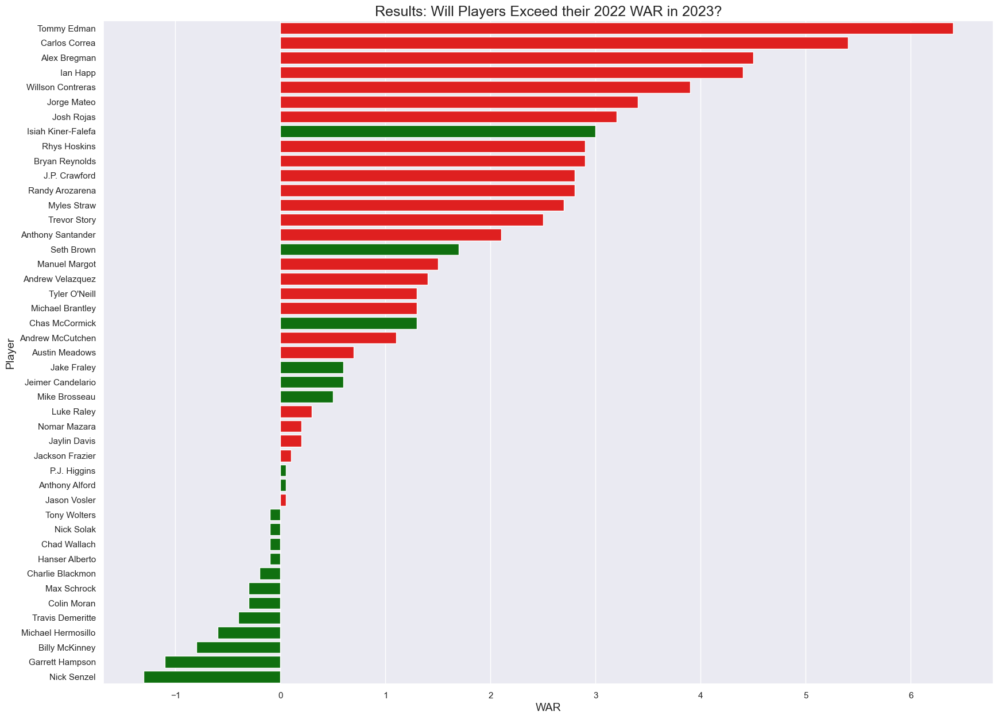

In [1153]:
#plot everything

fig, ax = plt.subplots(1, 1, figsize=(20, 15))
sns.barplot(x=ss_pos_df_2023_2_sort.WAR,
            y=ss_pos_df_2023_2_sort.Player,
            palette=ss_pos_df_2023_2_color)
ax.set_title("Results: Will Players Exceed their 2022 WAR in 2023?", size=18)
ax.set_ylabel("Player", size=14)
ax.set_xlabel("WAR", size=14)
plt.show()

In [1154]:
#export out
from pathlib import Path  
filepath = Path('ss_pos_df_2023_2_final_pred.csv')  
filepath.parent.mkdir(parents=True, exist_ok=True)  
ss_pos_df_2023_2.to_csv(filepath,index=False)  

In [1295]:
sh = pd.read_csv('ss_all_1980-2022.csv', usecols=['Player','WAR','Age','Season','OPS+','Rfield'])
edman = sh[sh['Player']=='Tommy Edman'].reset_index(drop=True)
edman = edman.sort_values('Age',ascending=False)
ikf = sh[sh['Player']=='Isiah Kiner-Falefa'].reset_index(drop=True)
ikf = ikf.sort_values('Age',ascending=False)

cc = sh[sh['Player']=='Carlos Correa'].reset_index(drop=True)
cc = cc.sort_values('Age',ascending=False)

sb = sh[sh['Player']=='Seth Brown'].reset_index(drop=True)
sb = sb.sort_values('Age',ascending=False)

four_batters = pd.concat([edman,ikf,cc,sb])
four_batters

,Player,WAR,Season,Age,OPS+,Rfield
0,Tommy Edman,6.4,2022,27,108.0,19
2,Tommy Edman,3.7,2021,26,93.0,7
3,Tommy Edman,1.3,2020,25,90.0,7
1,Tommy Edman,3.9,2019,24,122.0,10
1,Isiah Kiner-Falefa,3.0,2022,27,84.0,10
0,Isiah Kiner-Falefa,3.7,2021,26,85.0,10
2,Isiah Kiner-Falefa,2.0,2020,25,93.0,10
4,Isiah Kiner-Falefa,-0.2,2019,24,58.0,-1
3,Isiah Kiner-Falefa,1.7,2018,23,80.0,9
3,Carlos Correa,5.4,2022,27,140.0,3


In [1291]:
avg_war = sh[['WAR','Season']].groupby(['Season']).agg({'WAR':['mean']}).reset_index()
#avg_war = pd.DataFrame(avg_war['Season'],avg_war['WAR'])
avg_war = avg_war.rename(columns={"Season":"Season","mean":"AVG_WAR"})
new_df=avg_war[avg_war['Season']>=2015].reset_index(drop=True)


0    27
Name: Age, dtype: int64

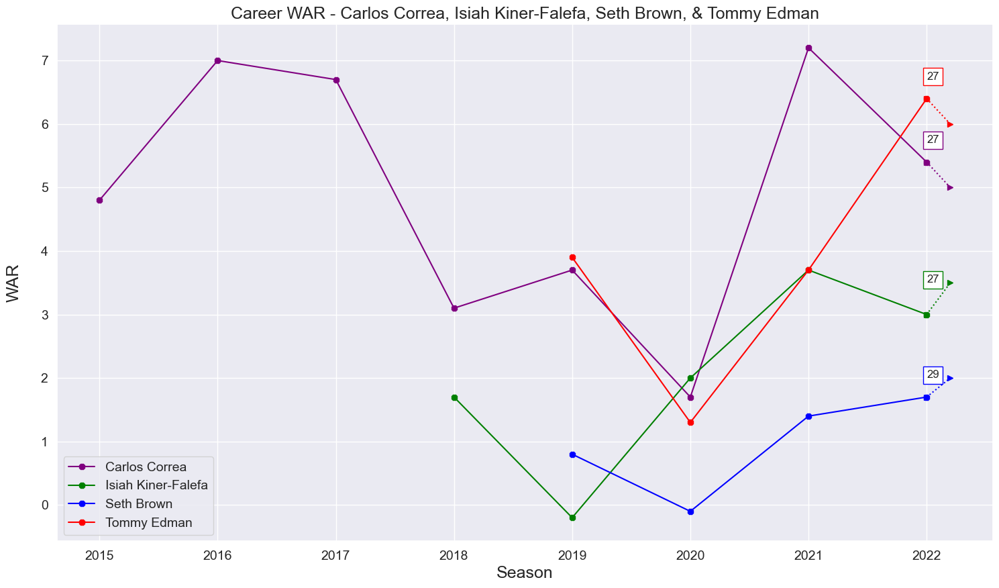

In [1340]:
#plot everything
import matplotlib.lines as lines

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(1,1,1)

my_colors = {'Tommy Edman':'red',
             'Carlos Correa':'purple',
            'Isiah Kiner-Falefa':'green',
            'Seth Brown':'blue'}

for key, grp in four_batters.groupby(['Player']):
    grp.plot(ax=ax, kind='line', x='Season', y='WAR', color = my_colors[key], label=key, marker='8')

plt.title('Career WAR - Carlos Correa, Isiah Kiner-Falefa, Seth Brown, & Tommy Edman', fontsize=18)
ax.set_xlabel('Season', fontsize=18)
ax.set_ylabel('WAR', fontsize=18, labelpad=20)
ax.grid(b=True, which='major')
ax.tick_params(axis='x',labelsize=14, rotation=0)
ax.tick_params(axis='y',labelsize=14, rotation=0)

ax.set_xticks(range(2015,2025))

#do this for each player
x = [2022,2022.2]

y1 = [3,3.5]
y2 = [1.7,2]
y3 = [5.4,5]
y4 = [6.4,6]

plt.plot(x, y1,color='green', marker='>',linestyle='dotted')
plt.plot(x, y2,color='blue', marker='>',linestyle='dotted')
plt.plot(x, y3,color='purple', marker='>',linestyle='dotted')
plt.plot(x, y4,color='red', marker='>',linestyle='dotted')
#plt.plot(new_df['Season'], new_df['WAR'],color='black', marker='o',linestyle='dotted')

ax.text(2022, 6.7, str(27), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='red'))
ax.text(2022, 2, str(29), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='blue'))
ax.text(2022, 5.7, str(27), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='purple'))
ax.text(2022, 3.5, str(27), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='green'))

handles, labels = ax.get_legend_handles_labels()
handles = [handles[0],handles[1],handles[2],handles[3]]
labels = [labels[0],   labels[1],   labels[2],   labels[3]]
plt.legend(handles, labels, loc='best', fontsize=14, ncol=1)


plt.show()

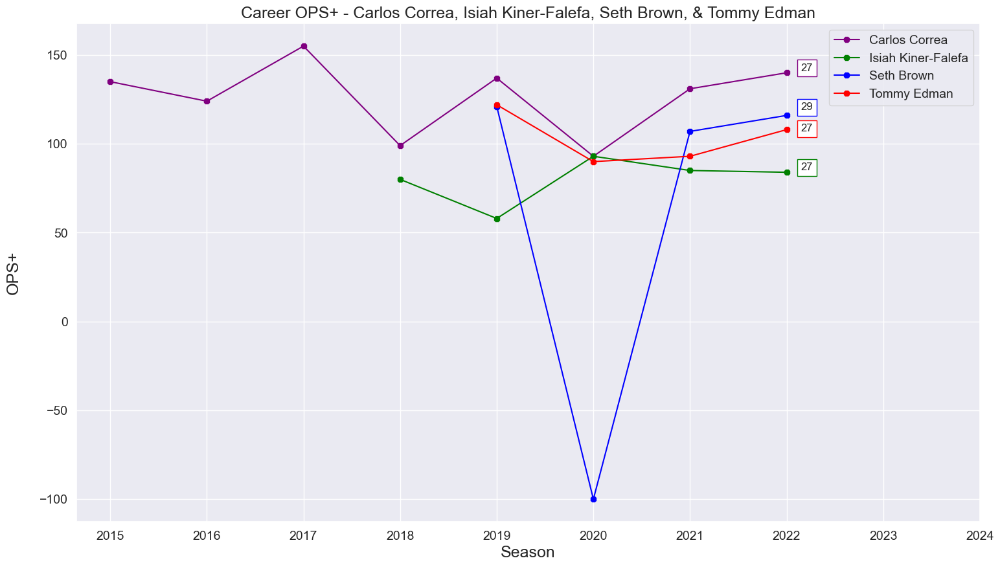

In [1335]:
#plot everything
import matplotlib.lines as lines

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(1,1,1)

my_colors = {'Tommy Edman':'red',
             'Carlos Correa':'purple',
            'Isiah Kiner-Falefa':'green',
            'Seth Brown':'blue'}

for key, grp in four_batters.groupby(['Player']):
    grp.plot(ax=ax, kind='line', x='Season', y='OPS+', color = my_colors[key], label=key, marker='8')

plt.title('Career OPS+ - Carlos Correa, Isiah Kiner-Falefa, Seth Brown, & Tommy Edman', fontsize=18)
ax.set_xlabel('Season', fontsize=18)
ax.set_ylabel('OPS+', fontsize=18, labelpad=20)
ax.tick_params(axis='x',labelsize=14, rotation=0)
ax.tick_params(axis='y',labelsize=14, rotation=0)

ax.set_xticks(range(2015,2025))

ax.text(2022.15, 107, str(27), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='red'))
ax.text(2022.15, 119, str(29), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='blue'))
ax.text(2022.15, 141, str(27), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='purple'))
ax.text(2022.15, 85, str(27), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='green'))

handles, labels = ax.get_legend_handles_labels()
handles = [handles[0],handles[1],handles[2],handles[3]]
labels = [labels[0],   labels[1],   labels[2],   labels[3]]
plt.legend(handles, labels, loc='best', fontsize=14, ncol=1)


plt.show()

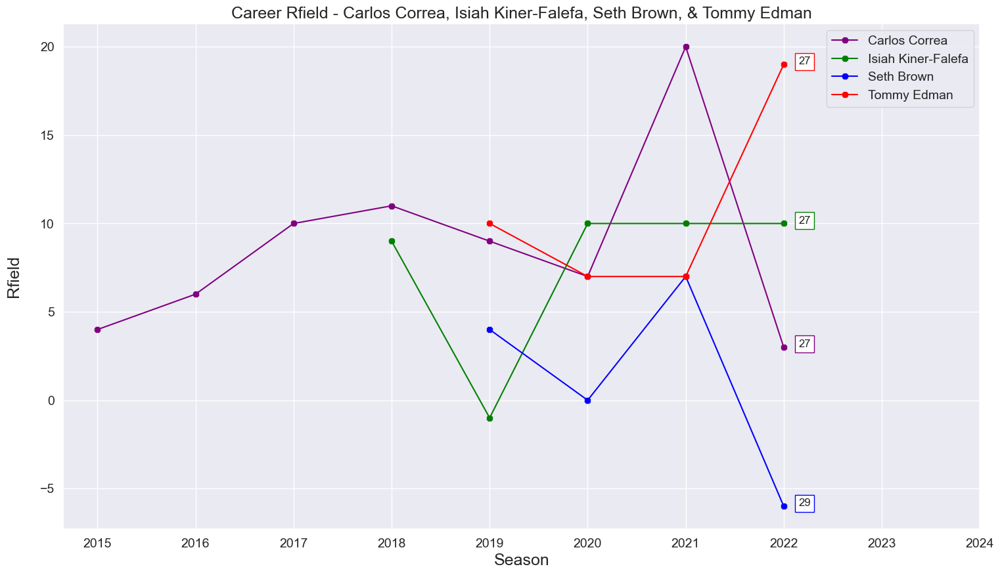

In [1337]:
#plot everything
import matplotlib.lines as lines

fig = plt.figure(figsize=(18,10))
ax = fig.add_subplot(1,1,1)

my_colors = {'Tommy Edman':'red',
             'Carlos Correa':'purple',
            'Isiah Kiner-Falefa':'green',
            'Seth Brown':'blue'}

for key, grp in four_batters.groupby(['Player']):
    grp.plot(ax=ax, kind='line', x='Season', y='Rfield', color = my_colors[key], label=key, marker='8')

plt.title('Career Rfield - Carlos Correa, Isiah Kiner-Falefa, Seth Brown, & Tommy Edman', fontsize=18)
ax.set_xlabel('Season', fontsize=18)
ax.set_ylabel('Rfield', fontsize=18, labelpad=20)
ax.tick_params(axis='x',labelsize=14, rotation=0)
ax.tick_params(axis='y',labelsize=14, rotation=0)

ax.set_xticks(range(2015,2025))

ax.text(2022.15, 19, str(27), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='red'))
ax.text(2022.15, -6, str(29), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='blue'))
ax.text(2022.15, 3, str(27), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='purple'))
ax.text(2022.15, 10, str(27), rotation = 0, fontsize = 12, bbox=dict(facecolor='white', edgecolor='green'))

handles, labels = ax.get_legend_handles_labels()
handles = [handles[0],handles[1],handles[2],handles[3]]
labels = [labels[0],   labels[1],   labels[2],   labels[3]]
plt.legend(handles, labels, loc='best', fontsize=14, ncol=1)


plt.show()